# 1. Data understanding & Attributes (CUB)

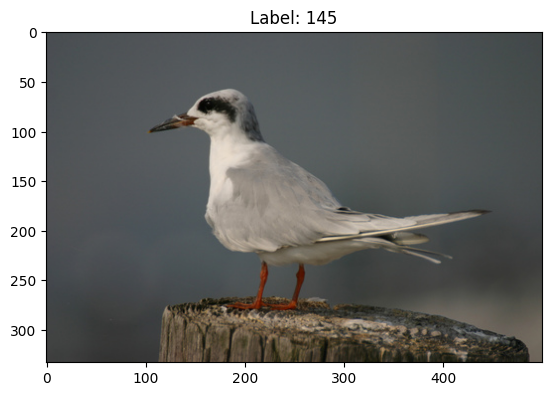

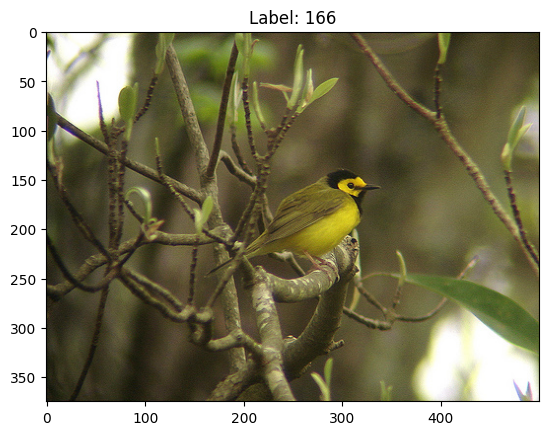

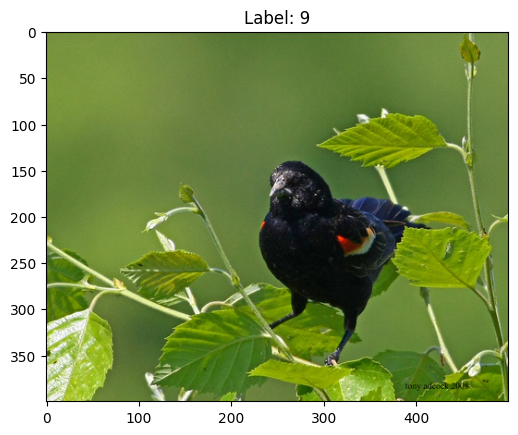

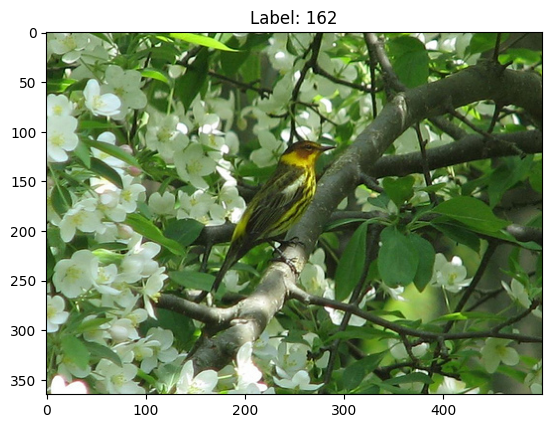

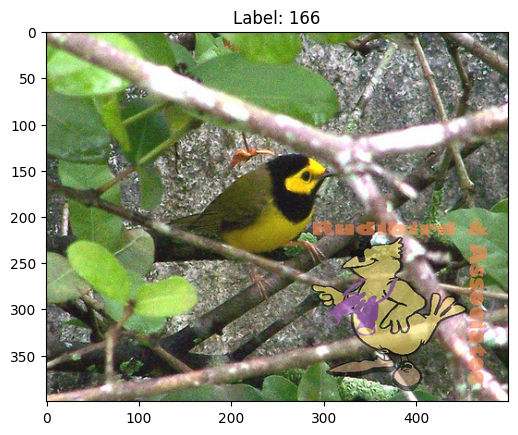

...

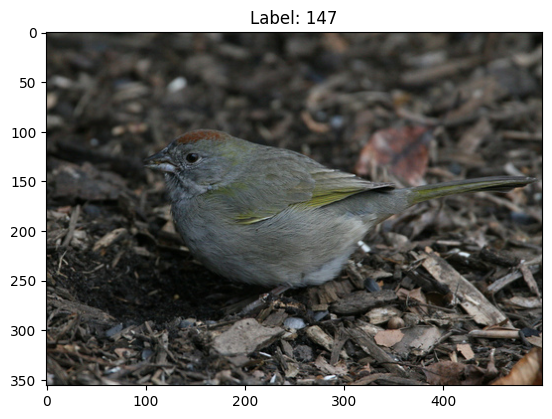

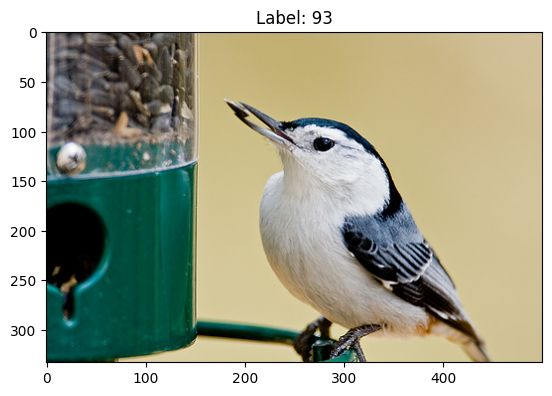

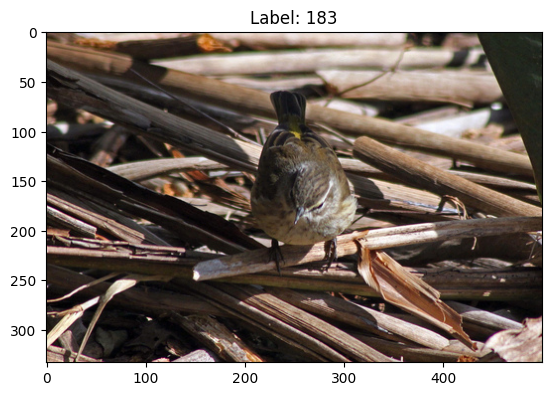

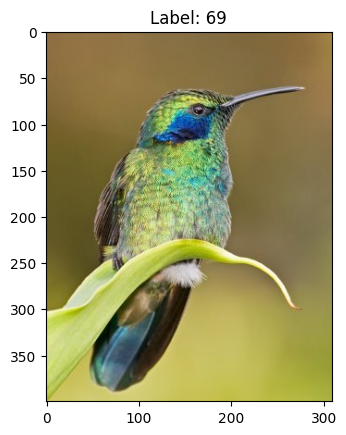

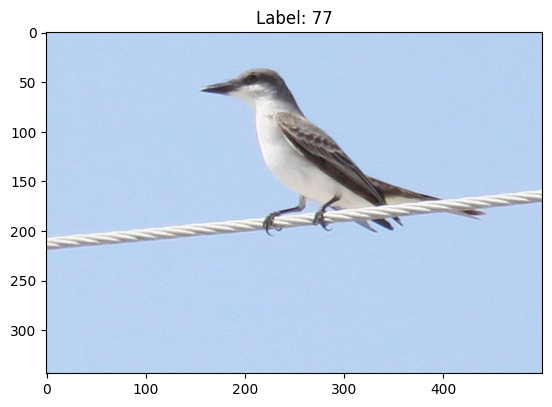

In [ ]:
# Showing 50 samples(image + label)
import matplotlib.pyplot as plt
for i in range(20, 70):
    row = ds["train"][i]
    plt.imshow(row["image"])
    plt.title(f"Label: {row['label']}")
    plt.show()

In [ ]:
import pandas as pd
df = pd.DataFrame(ds["train"])
print(df.head(100))
#print(df.head())

    img_id                                              image  label  \
0     9468  <PIL.JpegImagePlugin.JpegImageFile image mode=...    160   
1     5590  <PIL.JpegImagePlugin.JpegImageFile image mode=...     95   
2     2518  <PIL.JpegImagePlugin.JpegImageFile image mode=...     43   
3     9880  <PIL.JpegImagePlugin.JpegImageFile image mode=...    167   
4      115  <PIL.JpegImagePlugin.JpegImageFile image mode=...      1   
..     ...                                                ...    ...   
95    3438  <PIL.JpegImagePlugin.JpegImageFile image mode=...     59   
96   10368  <PIL.JpegImagePlugin.JpegImageFile image mode=...    176   
97   10953  <PIL.JpegImagePlugin.JpegImageFile image mode=...    185   
98    3721  <PIL.JpegImagePlugin.JpegImageFile image mode=...     63   
99    7373  <PIL.Image.Image image mode=RGB size=500x400 a...    125   

                            bbox  
0   [114.0, 134.0, 340.0, 287.0]  
1    [136.0, 99.0, 335.0, 214.0]  
2    [105.0, 31.0, 395.0, 136.

In [ ]:
#unique label ids (slice returns column lists)
unique_ids_500 = set(ds["train"]["label"][:500])
print("Unique ids in first 500:", sorted(list(unique_ids_500))[:10], "...")

#unique ids across the whole split
unique_ids_all = set(ds["train"]["label"])
print("Total unique label ids in train:", len(unique_ids_all))

#Map ids -> class names
id2label = ds["train"].features["label"].int2str
print("First sample id/name:",
      ds["train"][0]["label"], "->", id2label(ds["train"][0]["label"]))

#Add a readable 'label_name' column
ds = ds.map(lambda e: {"label_name": id2label(e["label"])})
print(ds["train"][0]["label_name"])

#Quick table preview (first 50 rows, without images)
preview = pd.DataFrame({
    "label_id": ds["train"]["label"][:50],
    "label_name": [id2label(i) for i in ds["train"]["label"][:50]],
})
preview

Unique ids in first 500: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9] ...
Total unique label ids in train: 200
First sample id/name: 160 -> Blue_winged_Warbler


Map:   0%|          | 0/5394 [00:00<?, ? examples/s]

Map:   0%|          | 0/600 [00:00<?, ? examples/s]

Map:   0%|          | 0/5794 [00:00<?, ? examples/s]

Blue_winged_Warbler


,label_id,label_name
0,160,Blue_winged_Warbler
1,95,Hooded_Oriole
2,43,Frigatebird
3,167,Kentucky_Warbler
4,1,Laysan_Albatross
5,198,Winter_Wren
6,118,Field_Sparrow
7,143,Common_Tern
8,36,Acadian_Flycatcher
9,37,Great_Crested_Flycatcher


In [ ]:
subset = ds["train"].select(range(500))
unique_ids = set(example["label"] for example in subset)
print("Unique ids:", len(unique_ids))

Unique ids: 184


In [ ]:
#starting image preprocessing + augmentation pipelines(to reduce overfitting and improve generalization) for training and testing:

import torch
from torch.utils.data import DataLoader
from torchvision import transforms
IMG_SIZE = 224

#some notes for myself:
#We can try 384–448 later for a boost
#224: the classic input size for trained CNNs (like ResNet, VGG,...).
#Most pretrained models expect 224*224, so it’s the safe/default choice.
#384 / 448: larger image size to give the model more detail to work with, which can improve accuracy.
#224: fast, standard, baseline.
#384–448: slower, heavier, but often slightly better performance.

In [ ]:
#Notes on the steps of training and testing:

#scaling every image to 256×256 to make images consistent.
#randomly crop a region (60–100% of image area): scale=(0.6, 1.0)
#p=0.5: 50% chance to flip left-right (good for images where orientation isn’t fixed).
#ColorJitter(0.2,0.2,0.2,0.1): randomly changes brightness, contrast, saturation, hue to make model robust to lighting/color differences.
#hue can shift by ±0.1 (range is [-0.5, 0.5]).

#converting PIL(Python Imaging Library (now Pillow)) image to PyTorch tensor (C*H*W, values in [0,1]).
#This represents images as objects with width, height, and pixel values (e.g. RGB 0–255).
#Most torchvision transforms expect PIL images before converting to tensors.
#PyTorch tensor: a multi-dimensional array (like NumPy arrays, but for PyTorch).
#Images become tensors shaped [C, H, W] with float values: C * H * W
#C = channels (3 for RGB, 1 for grayscale)
#H = height (pixels)
#W = width (pixels)
#Example: a red pixel (255, 0, 0) --> tensor [1.0, 0.0, 0.0].
#After ToTensor(), pixel values go from 0–255 --> 0.0–1.0.

#Normalize(mean, std): standardize pixels with ImageNet stats, because most pretrained models (ResNet, ViT, ...) were trained on ImageNet, where images were normalized with:
#mean = (0.485, 0.456, 0.406), std = (0.229, 0.224, 0.225).
#Using the same stats makes our inputs match what the model expects, so features transfer correctly.

#CenterCrop(IMG_SIZE): take the middle 224×224 crop (deterministic, no randomness).

from PIL import Image
train_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.6, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(0.2,0.2,0.2,0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485,0.456,0.406),
                         std=(0.229,0.224,0.225)),
])

test_tfms = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.485,0.456,0.406),
                         std=(0.229,0.224,0.225)),
])

def hf_set_transform(split, tfm):
    def _apply(examples):
        examples["pixel_values"] = [tfm(img.convert("RGB")) for img in examples["image"]]
        return examples
    return ds[split].with_transform(_apply)

train_set = hf_set_transform("train", train_tfms)
test_set  = hf_set_transform("test",  test_tfms)

def collate(batch):
    x = torch.stack([b["pixel_values"] for b in batch])
    y = torch.tensor([b["label"] for b in batch], dtype=torch.long)
    return x, y

BATCH = 32  # can be increased for boost
train_loader = DataLoader(train_set, batch_size=BATCH, shuffle=True, num_workers=1, collate_fn=collate, pin_memory=True, worker_init_fn=seed_worker,
generator=g)
test_loader  = DataLoader(test_set,  batch_size=BATCH, shuffle=False, num_workers=1, collate_fn=collate, pin_memory=True, worker_init_fn=seed_worker,
generator=g)

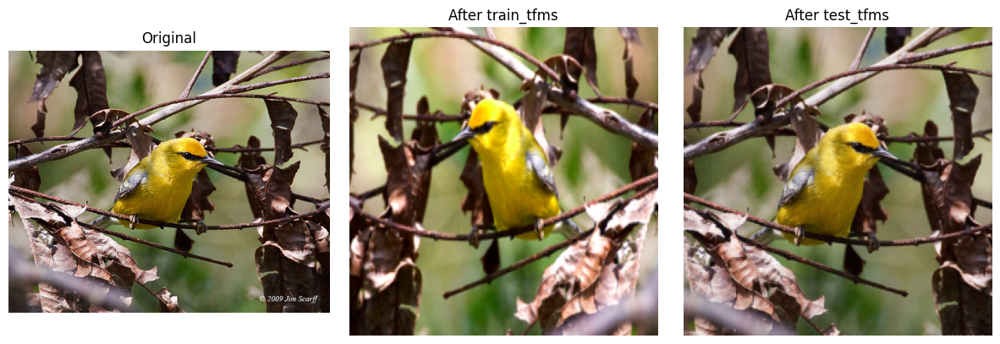

In [ ]:
#showing what a sample training image looks like before vs after these transforms:
#seting seed so random augmentations are reproducible:
torch.manual_seed(42)

#picking one sample:
example = ds["train"][0]
img = example["image"]   # PIL.Image
label = example["label"]

# apply transforms
img_train = train_tfms(img)
img_test  = test_tfms(img)

# unnormalize helper
def unnormalize(t):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return t * std + mean
# making images valid for visualization after unnormalization:
img_train_vis = unnormalize(img_train).clamp(0, 1)
img_test_vis  = unnormalize(img_test).clamp(0, 1)

# show original, train, and test transforms
fig, axs = plt.subplots(1, 3, figsize=(12,4))

axs[0].imshow(img)                           # original PIL
axs[0].set_title("Original")
axs[0].axis("off")

axs[1].imshow(img_train_vis.permute(1,2,0))  # tensor (HWC)
axs[1].set_title("After train_tfms")
axs[1].axis("off")

axs[2].imshow(img_test_vis.permute(1,2,0))
axs[2].set_title("After test_tfms")
axs[2].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# Class Distribution:
import pandas as pd
from collections import Counter

# count labels in train, val, test
train_counts = Counter(ds["train"]["label"])
val_counts   = Counter(ds["validation"]["label"])
test_counts  = Counter(ds["test"]["label"])

# convert to DataFrame
df_dist = pd.DataFrame({
    "class_id": list(train_counts.keys()),
    "train_count": list(train_counts.values()),
    "val_count": [val_counts[i] for i in train_counts.keys()],
    "test_count": [test_counts[i] for i in train_counts.keys()],
})

# add class names
df_dist["class_name"] = df_dist["class_id"].apply(id2label)

# total images per class
df_dist["total"] = df_dist["train_count"] + df_dist["val_count"] + df_dist["test_count"]

df_dist = df_dist.sort_values("total", ascending=False)

display(df_dist.head(10))   # top 10 most common
display(df_dist.tail(10))   # rarest classes

,class_id,train_count,val_count,test_count,class_name,total
0,160,27,3,30,Blue_winged_Warbler,60
1,95,27,3,30,Hooded_Oriole,60
2,43,27,3,30,Frigatebird,60
4,1,27,3,30,Laysan_Albatross,60
7,143,27,3,30,Common_Tern,60
5,198,27,3,30,Winter_Wren,60
11,82,27,3,30,White_breasted_Kingfisher,60
9,37,27,3,30,Great_Crested_Flycatcher,60
71,68,27,3,30,Rufous_Hummingbird,60
68,90,27,3,30,Mockingbird,60


,class_id,train_count,val_count,test_count,class_name,total
50,150,27,3,21,Black_capped_Vireo,51
17,112,27,3,20,Baird_Sparrow,50
35,100,27,3,20,White_Pelican,50
116,186,27,3,20,American_Three_toed_Woodpecker,50
150,64,27,3,20,Slaty_backed_Gull,50
10,104,27,3,19,Whip_poor_Will,49
64,7,27,3,18,Rhinoceros_Auklet,48
66,17,27,3,15,Spotted_Catbird,45
33,4,27,3,14,Crested_Auklet,44
104,5,27,3,11,Least_Auklet,41
